
# Практическое задание 4. Бустинг и бэггинг

## Общая информация
Дата выдачи: 14.01.2024

Мягкий дедлайн: 28.01.2024 23:59 MSK

Жёсткий дедлайн: 04.02.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. 

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-04-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании вам предстоит вручную запрограммировать один из самых мощных алгоритмов машинного обучения — бустинг. Работать мы будем на двух наборах данных: многомерных данных по кредитам с kaggle и синтетических двумерных. В данных с kaggle целевая переменная показывает, вернуло ли кредит физическое лицо:

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px

from scipy.stats import mode
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, f1_score, log_loss, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier

In [2]:
!wget  -O 'bank_data.csv' -q 'https://www.dropbox.com/s/uy27mctxo0gbuof/bank_data.csv?dl=0'

In [3]:
df = pd.read_csv('bank_data.csv')
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
4420,71,retired,single,university.degree,no,yes,no,cellular,aug,thu,...,1,6,2,failure,-2.9,92.201,-31.4,0.851,5076.2,1
1411,34,services,divorced,high.school,no,yes,yes,cellular,may,fri,...,2,999,0,nonexistent,-1.8,92.893,-46.2,1.250,5099.1,1
8793,42,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,5,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,-1
4770,54,blue-collar,married,professional.course,unknown,yes,yes,telephone,may,mon,...,3,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,-1
1650,37,entrepreneur,married,university.degree,no,yes,no,telephone,jun,mon,...,1,999,0,nonexistent,1.4,94.465,-41.8,4.865,5228.1,-1


Разделим на train и test (random_state не меняем)

In [4]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

Генерируем синтетические данные (seed не меняем)

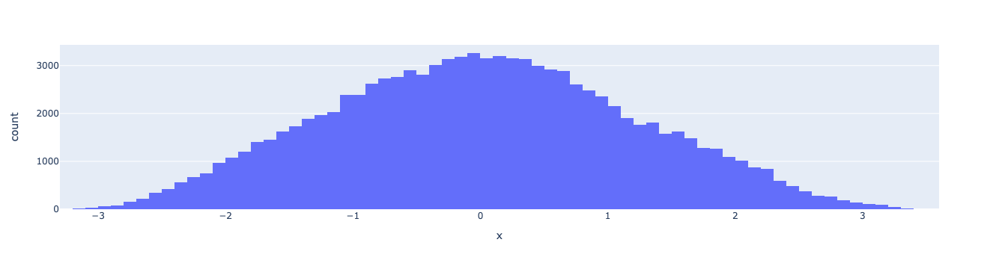

In [5]:
np.random.seed(42)

num_obs = 10 ** 5
num_thresholds = 50

X_synthetic = np.random.normal(scale=3, size=[num_obs, 2])
x1_thresholds = np.random.choice(X_synthetic[:, 0], num_thresholds, False)
x2_thresholds = np.random.choice(X_synthetic[:, 1], num_thresholds, False)

gains = np.random.uniform(-0.4086, 0.5, size=[2 * num_thresholds, 1])
x1_thresholds_cond = [X_synthetic[:, 0] >= threshold for threshold in x1_thresholds]
x2_thresholds_cond = [X_synthetic[:, 1] >= threshold for threshold in x2_thresholds]

noise = np.random.uniform(-0.5, 0.5, size=num_obs)

y_synthetic_probits = np.sum(
    gains[:num_thresholds] * x1_thresholds_cond + gains[num_thresholds:] * x2_thresholds_cond, axis=0
) + noise
y_synthetic = np.sign(y_synthetic_probits)

X_train_synthetic, y_train_synthetic = X_synthetic[:int(num_obs * 0.8)], y_synthetic[:int(num_obs * 0.8)]
X_test_synthetic, y_test_synthetic = X_synthetic[int(num_obs * 0.8):], y_synthetic[int(num_obs * 0.8):]

px.histogram(x = y_synthetic_probits, nbins=100)

Некоторый полезный код для визуализации предсказаний (пригодится позже)

In [6]:
import matplotlib.pyplot as plt

def plot_predicts(model, features, targets, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='', mode='classification'):
    '''
    Функция для визуализации предсказаний модели на двухмерной плоскости
    param model: обученная модель классификации или регрессии для двухмерных объектов
    param features: признаки выборки (a.k.a. X)
    param targets: целевая переменная выборки (a.k.a y)
    param x_lim: пределы для x
    param y_lim: пределы для y
    param examples_density: доля выборки, которая будет нарисована
    param steps: частота разбиения плоскости
    param num_ticks: число подписей на графике
    param title: заголовок графика
    param mode: режим 'classification' - вероятности положительного класса
                режим 'regression' - вещественная целевая переменная
    '''
    
    mask = np.random.choice([True, False], size=features.shape[0], 
                            p=[examples_density, 1.0 - examples_density])
    features_x = (features[mask, 0] - x_lim[0]) / (x_lim[1] - x_lim[0]) * steps
    features_y = (features[mask, 1] - y_lim[0]) / (y_lim[1] - y_lim[0]) * steps
    
    xs = np.linspace(x_lim[0], x_lim[1], steps)
    ys = np.linspace(y_lim[0], y_lim[1], steps)
    
    xs, ys = np.meshgrid(xs, ys)
    grid = np.stack([xs.flatten(), ys.flatten()], axis=1)
    if mode == 'classification':
        predicts = model.predict_proba(grid)[:, 1].reshape(steps, steps)
        values = (targets[mask] == 1).astype(float)
    elif mode == 'regression':
        predicts = model.predict(grid).reshape(steps, steps)
        values = targets[mask]
    else:
        raise ValueError('Unknown mode')
    
    plt.figure(figsize=(10, 10))
    plt.imshow(predicts, origin='lower')
    plt.scatter(features_x, features_y, c=values, edgecolors='white', linewidths=1.5)
    plt.colorbar()
    
    plt.xticks(np.linspace(0, steps, num_ticks), np.linspace(x_lim[0], x_lim[1], num_ticks))
    plt.yticks(np.linspace(0, steps, num_ticks), np.linspace(y_lim[0], y_lim[1], num_ticks))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.grid()
    plt.show()

#### 1. (4 балла) Реализуйте бустинг для задачи бинарной классификации.

Поскольку градиентный бустинг обучается через последовательное создание моделей, может получиться так, что оптимальная с точки зрения генерализации модель будет получена на промежуточной итерации. Обычно для контроля такого поведения в методе `fit` передается также валидационная выборка, по которой можно оценивать общее качество модели в процессе обучения (желательно делать это каждую итерацию, но если ваша имплементация слишком медленная или ваше железо не тянет, можно делать это реже). Кроме того, нет смысла обучать действительно глубокую модель на 1000 деревьев и больше, если оптимальный ансамбль получился, к примеру, на 70 итерации и в течение какого-то количества итераций не улучшился - поэтому мы также задействуем early stopping при отсутствии улучшений в течение некоторого числа итераций.

In [7]:
import inspect

from numpy import ndarray
from scipy.special import expit
from abc import ABC, abstractmethod
from typing import Callable
from ipywidgets import IntProgress
from sklearn.base import BaseEstimator, ClassifierMixin


class Sampler(ABC):
    def __iter__(self):
        return self

    @abstractmethod
    def __next__(self):
        pass

    @abstractmethod
    def gamma(self, old_predictions: np.ndarray, new_predictions: np.ndarray, boundaries: tuple):
        pass


class Subsampler(Sampler):
    def __init__(
            self, 
            X, y,
            subsample: float, 
            loss_fn: Callable[[np.ndarray, np.ndarray], float],
            random_seed: int = None) -> None:
        self.X = X
        self.y = y
        self.random_seed = random_seed
        self.rng = np.random.default_rng(seed=self.random_seed)
        self.batch_size = round(len(X) * subsample)
        self.loss_fn = loss_fn
        self.j = None

    def __next__(self):
        self.j = self.rng.integers(0, len(self.X), size=self.batch_size)
        return self.X[self.j], self.y[self.j]

    def gamma(self, old_predictions: np.ndarray, new_predictions: np.ndarray, boundaries: tuple=(0.01, 1)):
        """
        Функция для поиска оптимального значения параметра gamma (коэффициент перед новой базовой моделью).
        :param y: вектор целевой переменной
        :param old_predictions: вектор суммы предсказаний предыдущих моделей (до сигмоиды)
        :param new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
        :param boundaries: в каком диапазоне искать оптимальное значение ɣ (array-like объект из левой и правой границ)
        """
        # Определеяем начальные лосс и оптимальную гамму
        loss, optimal_gamma = self.loss_fn(self.y[self.j], old_predictions), 0
        # Множество, на котором будем искать оптимальное значение гаммы
        gammas = np.linspace(*boundaries, 100)
        # Простым перебором ищем оптимальное значение
        for gamma in gammas:
            predictions = old_predictions + gamma * new_predictions
            gamma_loss = self.loss_fn(self.y[self.j], predictions)
            if gamma_loss < loss:
                optimal_gamma = gamma
                loss = gamma_loss
        
        return optimal_gamma

class StaticSampler(Sampler):
    def __init__(self, X, y, learning_rate: float) -> None:
        self.X = X
        self.y = y
        self.learning_rate = learning_rate

    def __next__(self):
        return self.X, self.y

    def gamma(self, old_predictions: ndarray, new_predictions: ndarray, boundaries: tuple=(0.01, 1)):
        return 1.


class Boosting(ClassifierMixin, BaseEstimator):
    
    def __init__(
        self,
        base_model_class=DecisionTreeRegressor,
        base_model_params: dict={'max_features': 0.1},
        n_estimators: int=10,
        learning_rate: float=0.1,
        subsample: float=0.3,
        random_seed: int=228,
        custom_loss: tuple=None,
        use_best_model: bool=False,
        n_iter_early_stopping: int=None,
        validation_fraction=0.1,
    ):
        
        # Класс базовой модели
        self.base_model_class = base_model_class
        # Параметры для инициализации базовой модели
        self.base_model_params = base_model_params
        # Число базовых моделей
        self.n_estimators = n_estimators
        # Длина шага (которая в лекциях обозначалась через eta)
        self.learning_rate = learning_rate
        # Доля объектов, на которых обучается каждая базовая модель
        self.subsample = subsample
        # seed для бутстрапа, если хотим воспроизводимость модели
        self.random_seed = random_seed
        # Использовать ли при вызове predict и predict_proba лучшее
        # с точки зрения валидационной выборки число деревьев в композиции
        self.use_best_model = use_best_model
        # число итераций, после которых при отсутствии улучшений на валидационной выборке обучение завершается
        self.n_iter_early_stopping = n_iter_early_stopping
        # Доля данных выбираемая для валидации
        self.validation_fraction = validation_fraction
        self._best_n_estimators = 0
        
        # Плейсхолдер для нулевой модели
        self.initial_model_pred = None
        
        # Список для хранения весов при моделях
        self.gammas = []
        
        # Создаем список базовых моделей
        self.models = []
        self.loss_history = []
        self.classes_ = np.array([-1., 1.])
        # Если используем свою функцию потерь, ее нужно передать как список из loss-a и его производной
        if custom_loss is not None:
            self.loss_fn, self.loss_derivative = custom_loss
        else:
            self.loss_fn = lambda y, z: -np.log(expit(y * z)).mean()
            self.loss_derivative = lambda y, z: -y * expit(-y * z)

    def get_params(self, deep=True) -> dict:
        signature = inspect.signature(self.__class__.__init__)
        default_params = {
            k: v.default
            for k, v in signature.parameters.items()
            if v.default is not inspect.Parameter.empty
        }
        params = dict(
            base_model_class=self.base_model_class,
            base_model_params=self.base_model_params,
            n_estimators=self.n_estimators,
            learning_rate=self.learning_rate,
            subsample=self.subsample,
            random_seed=self.random_seed,
            use_best_model=self.use_best_model,
            n_iter_early_stopping=self.n_iter_early_stopping,
        )
        params = {
            key: value
            for key, value in params.items()
            if key not in default_params or value != default_params[key]
        }
        return params
    
    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self
        
        
    def _fit_new_model(self, X: np.ndarray, y: np.ndarray, n_model: int):
        """
        Функция для обучения одной базовой модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :param n_model: номер модели, которую хотим обучить
        """
        model = self.base_model_class(**self.base_model_params)
        model.fit(X, y)
        self.models.append(model)
        return model.predict(X)
        
    def _fit_initial_model(self, X, y):
        """
        Функция для построения нулевой (простой) модели. Не забудьте взять логарифм, потому что сигмоида применяется
        уже к сумме предсказаний базовых моделей, а не к каждому предсказанию каждой модели по отдельности.
        Подойдёт константная модель, возвращающая самый популярный класс,
        но если хотите, можете сделать что-нибудь посложнее.
        """
        
        self.initial_model_pred = np.float64(mode(y, axis=None, keepdims=False).mode)
        return np.repeat([self.initial_model_pred], len(y))
    
    
    def _find_optimal_gamma(self, y: np.ndarray, old_predictions: np.ndarray,
                            new_predictions: np.ndarray, boundaries: tuple=(0.01, 1)):
        """
        Функция для поиска оптимального значения параметра gamma (коэффициент перед новой базовой моделью).
        :param y: вектор целевой переменной
        :param old_predictions: вектор суммы предсказаний предыдущих моделей (до сигмоиды)
        :param new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
        :param boundaries: в каком диапазоне искать оптимальное значение ɣ (array-like объект из левой и правой границ)
        """
        # Определеяем начальные лосс и оптимальную гамму
        loss, optimal_gamma = self.loss_fn(y, old_predictions), 0
        # Множество, на котором будем искать оптимальное значение гаммы
        gammas = np.linspace(*boundaries, 100)
        # Простым перебором ищем оптимальное значение
        for gamma in gammas:
            predictions = old_predictions + gamma * new_predictions
            gamma_loss = self.loss_fn(y, predictions)
            if gamma_loss < loss:
                optimal_gamma = gamma
                loss = gamma_loss
        
        return optimal_gamma

    def _eval_loss(self, X_val, y_val):
        eval_pred = self.predict(X_val)
        eval_loss = self.loss_fn(y_val, eval_pred)
        self.loss_history.append(eval_loss)
        
        
    def fit(self, X, y, eval_set=None, show_progress=False):
        """
        Функция для обучения всей модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :eval_set: кортеж (X_val, y_val) для контроля процесса обучения или None, если контроль не используется
        """
        self.classes_ = np.unique(y)
        self.models.clear()
        self.gammas.clear()
        self.loss_history.clear()
        
        best_loss = None
        if (self.use_best_model or self.n_iter_early_stopping):
            best_loss, self._best_n_estimators = np.inf, 0
            X, X_valid, y, y_valid = train_test_split(X, y, test_size=self.validation_fraction, random_state=self.random_seed)
            
        if self.subsample:
            sampler = Subsampler(X, y, self.subsample, self.loss_fn, self.random_seed)
        else:
            sampler = StaticSampler(X, y, self.learning_rate)

        X, y = next(sampler)
        y_pred = self._fit_initial_model(X, y)

        if show_progress:
            progress = IntProgress(min=0, max=self.n_estimators)
            display(progress)

        for i, (X, y) in zip(range(self.n_estimators), sampler):
            if show_progress:
                progress.value = i+1
                
            gradient =  self.loss_derivative(y, y_pred)
            y_pred_new = self._fit_new_model(X, -gradient, i)
            gamma = sampler.gamma(y_pred, y_pred_new)
            self.gammas.append(gamma)
            y_pred += self.learning_rate * gamma * y_pred_new

            if eval_set:
                X_eval, y_eval = eval_set
                eval_pred = self.predict(X_eval)
                eval_loss = self.loss_fn(y_eval, eval_pred)

            if best_loss:
                valid_pred = self.predict(X_valid)
                new_loss = self.loss_fn(y_valid, valid_pred)
                if new_loss < best_loss:
                    best_loss, self._best_n_estimators = new_loss, i

                if self.n_iter_early_stopping:
                    if i - self._best_n_estimators > self.n_iter_early_stopping:
                        break

        if self.use_best_model:
            self.models = self.models[:self._best_n_estimators]
            self.gammas = self.gammas[:self._best_n_estimators]

    def predict(self, X: np.ndarray):
        """
        Функция для предсказания классов обученной моделью бустинга
        :param X: матрица признаков
        """
        pred = self.predict_proba(X)
        return self.classes_[np.argmax(pred, axis=1)]

        
    def predict_proba(self, X: np.ndarray):
        """
        Функция для предсказания вероятностей классов обученной моделью бустинга
        :param X: матрица признаков
        """
        pred = np.repeat([np.float64(self.initial_model_pred)], len(X))
        for gamma, model in zip(self.gammas, self.models):
            resid_pred = model.predict(X)
            pred += gamma * resid_pred
        pred = expit(pred)
        inv_pred = 1 - pred
        return np.hstack([inv_pred.reshape((-1, 1)), pred.reshape((-1, 1))])

    def decision_function(self, X: np.ndarray):
        # dirty hack for roc_auc in RandomizedSearchCV
        return self.predict_proba(X)[:, 1]

    def __repr__(self) -> str:
        params = ', '.join(f'{key}={repr(value)}' for key, value in self.get_params().items())
        return f'Boosting({params})'

    def __str__(self) -> str:
        return self.__repr__()

In [8]:
%%time

boosting = Boosting()
boosting.fit(X_train_synthetic, y_train_synthetic)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(X_test_synthetic) > 0.5)
score = accuracy_score((y_test_synthetic == 1), np.round(preds))
print(f'Score={score}')
assert score > 0.9

Score=0.9068
CPU times: user 1.57 s, sys: 17.4 ms, total: 1.59 s
Wall time: 1.58 s


In [9]:
%%time
# При n_estimators=10 получались не стабильные результаты проверки score > 0.87
boosting = Boosting(n_estimators=30)
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
score = accuracy_score((df_test.y.values == 1), np.round(preds))
print('Score=', score)
assert score > 0.87

Score= 0.8787715517241379
CPU times: user 378 ms, sys: 2.54 ms, total: 381 ms
Wall time: 380 ms


In [10]:
# Проверяем параметры use_best_model и n_iter_early_stopping
boosting = Boosting(use_best_model=True, n_iter_early_stopping=20, n_estimators=1000, learning_rate=0.01, subsample=None)
boosting.fit(X_train_synthetic, y_train_synthetic, show_progress=True)
assert boosting._best_n_estimators < 100
assert len(boosting.models) == boosting._best_n_estimators
score = accuracy_score(y_test_synthetic, boosting.predict(X_test_synthetic))
print('Score=', score)

IntProgress(value=0, max=1000)

Score= 0.90115


#### 2. (2 балла) Сравните результаты вашей имплементации бустинга с указанными ниже базовыми моделями на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных. 

Варианты для базовой модели (разумеется, не надо их программировать самостоятельно, берите нужные классы из sklearn):

- Решающее дерево глубины 6
- Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)
- Линейная регрессия

Вопросы:

1) Какая из моделей имеет оптимальное качество? С чем это связано?

2) Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

3) Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

4) Визуализируйте предсказания моделей на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.

In [11]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import roc_auc_score, f1_score


models = (
    Boosting(base_model_class=DecisionTreeRegressor, base_model_params={'max_depth': 6}),
    Boosting(base_model_class=RandomForestRegressor, base_model_params={'n_estimators': 200, 'n_jobs': -1}),
    Boosting(base_model_class=LinearRegression, base_model_params={}, n_estimators=100),
)
for model in models:
    model.fit(X_train_synthetic, y_train_synthetic, show_progress=True)
    roc_auc = roc_auc_score(y_test_synthetic, model.predict_proba(X_test_synthetic)[:, 1])
    f1 = f1_score(y_test_synthetic, model.predict(X_test_synthetic))
    print('Synthetic', str(model.base_model_class.__name__), 'ROC AUC=', roc_auc, 'F1=', f1)

X_train, y_train = df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values
X_test, y_test = df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_test.y.values
for model in models:
    model.fit(X_train, y_train, show_progress=True)
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    f1 = f1_score(y_test, model.predict(X_test))
    print('Dataset', str(model.base_model_class.__name__), 'ROC AUC=', roc_auc, 'F1=', f1)
    

IntProgress(value=0, max=10)

Synthetic DecisionTreeRegressor ROC AUC= 0.9746303260260469 F1= 0.909035901573215


IntProgress(value=0, max=10)

Synthetic RandomForestRegressor ROC AUC= 0.981252418320952 F1= 0.9130698473668251


IntProgress(value=0)

Synthetic LinearRegression ROC AUC= 0.7976628936233844 F1= 0.6231957887587027


IntProgress(value=0, max=10)

Dataset DecisionTreeRegressor ROC AUC= 0.9457942285254757 F1= 0.8747913188647747


IntProgress(value=0, max=10)

Dataset RandomForestRegressor ROC AUC= 0.9504560097058947 F1= 0.8854454897620365


IntProgress(value=0)

Dataset LinearRegression ROC AUC= 0.9190379403794037 F1= 0.787363304981774


#### Какая из моделей имеет оптимальное качество? С чем это связано?

Оптимальное качество у регрессоров на основе деревьев. Связано может быть с тем, что линейная регрессия плохо работает с бинарной классификацией. Также модели на основе деревьев лучше обучаются под классификацию из-за особенностей построения дерева решений.

#### Какая из моделей сильнее переобучается?

Бустинг на основе случайного леса. Случай лес сам по себе является ансамблем, который использует переобученные деревья, а еще бустинг старается минимизировать ошибки

#### Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

Только чтобы быстрее обучать модели и поддерживать их как можно меньше. Нет смысла докидывать еще шагов, если больше нет прироста в метриках

In [12]:
%%time
linear_boosting = Boosting(
    base_model_class=LinearRegression,
    base_model_params={},
    n_iter_early_stopping=20,
    use_best_model=True,
    learning_rate=0.001,
    n_estimators=10000,
)
linear_boosting.fit(X_train, y_train, (X_test, y_test))
y_pred = linear_boosting.predict(X_test)
print('Accuracy', accuracy_score(y_test, y_pred))

Accuracy 0.8356681034482759
CPU times: user 1min 43s, sys: 5min 4s, total: 6min 47s
Wall time: 7.66 s


In [13]:
len(boosting.models)

12

Как видим для линейной регрессии можно было уже останавливаться на 12 шаге и не обучать 10000 моделей

#### Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

In [14]:
from sklearn.linear_model import LogisticRegression

logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)
y_pred = logreg_model.predict(X_test)
print('LogReg f1=', f1_score(y_test, y_pred))
print('LinearRegressionBoosting f1=', f1_score(y_test, linear_boosting.predict(X_test)))

LogReg f1= 0.8436642896324741
LinearRegressionBoosting f1= 0.8460373548712772


Нет, бустинг над линейными регрессиями хуже чем одна логистическая регрессия для задач бинарной классификации. ЛогРег был придуман для решения задач бинарной классификации и его Loss-функция лучше учитывает ошибки предсказаний классов, чем линейная регрессия

#### Визуализируйте предсказания моделей на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы

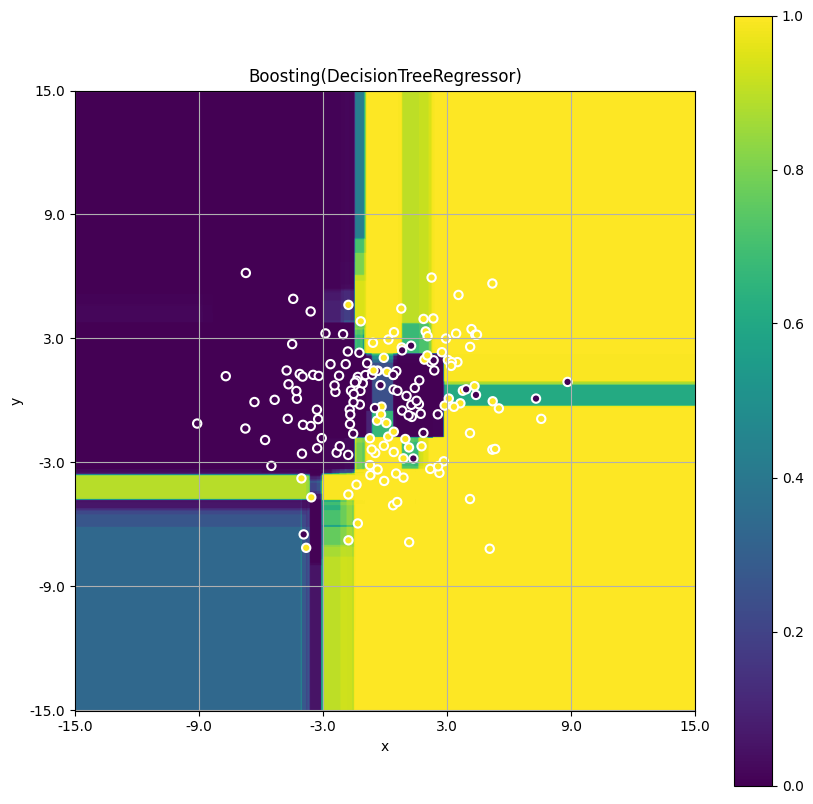

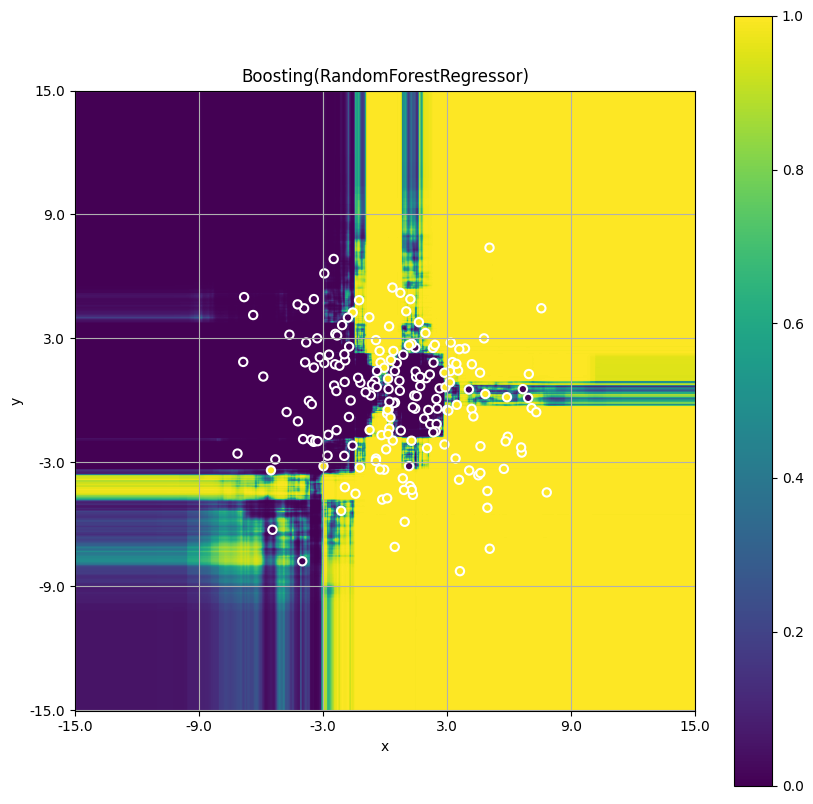

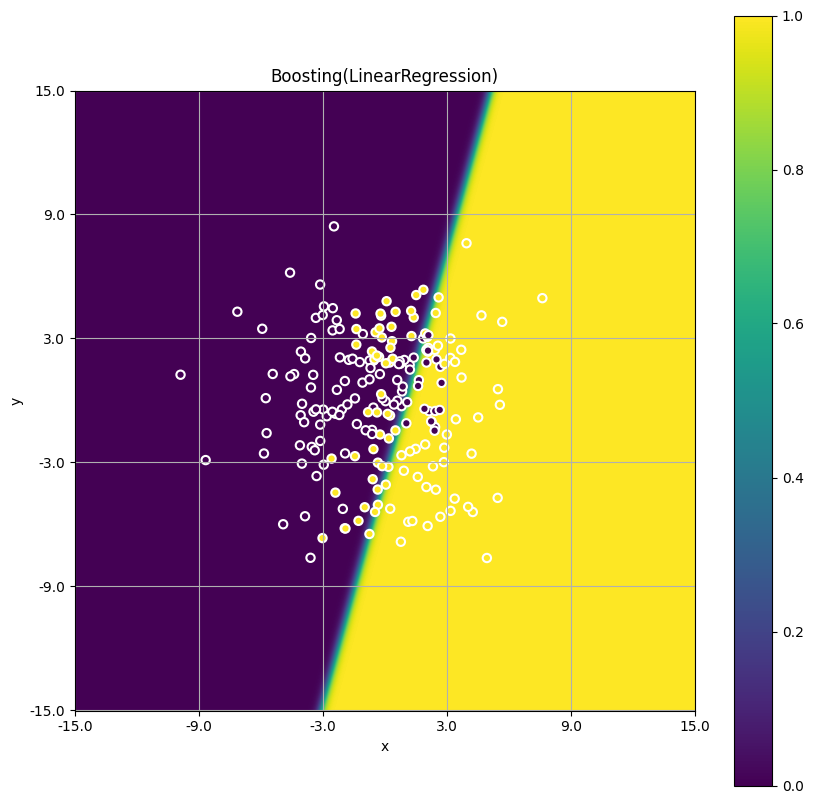

In [15]:
for model in models:
    model.fit(X_train_synthetic, y_train_synthetic)
    plot_predicts(model, X_test_synthetic, y_test_synthetic, title=f'Boosting({model.base_model_class.__name__})')

RandomForestRegression выглядит переобученной, в то время как LinearRegression очень плохо разделяет данные. 

#### 3. (2 балла) Мы разобрались с бустингом, теперь интересно посмотреть на совсем дикие комбинации моделей. Сравните результаты следующих моделей на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных.

Используйте логистическую регрессию, случайный лес и BaggingClassifier из sklearn.

- Случайный лес
- Бэггинг на деревьях (поставьте для базовых деревьев min_samples_leaf=1)
- Бэггинг на деревьях с обучением каждого дерева на подмножестве признаков (`max_features` около 0.6 в BaggingClassifier)
- Бэггинг, у которого базовой моделью является бустинг с большим числом деревьев (> 100)
- Бэггинг на логистических регрессиях

1) Какая из моделей имеет лучшее качество? С чем это связано?

Лучшее качество по ROC-AUC у модели `BaggingClassifier(estimator=Boosting(n_estimators=150))` 0.9808636615848482 на синтетических данных, при этом очень низкий скор по F1 0.6730801127881904 в сравнени6е с другими моделями. Видимо двойной ансамбль сильно переобучил модель.

2) Какая из моделей сильнее всего переобучается? Помогает ли бустингу ранняя остановка? 

Сильнее всего переобучился Бэггинг на бустинге. Ранняя остановка почти не влияет на качество модели.

3) Исправляет ли бэггинг переобученность бустинга с большим числом деревьев?

Не исправляет.

4) Что лучше: случайный лес или бэггинг на деревьях с сэмплированием признаков?

Случайны лес, его метрики гораздо лучше на синтетических данных и немного лучше на табличных данных

```
Synthetic RandomForestClassifier(n_jobs=-1) ROC AUC= 0.9773402657908825 F1= 0.9126508980272843
Dataset RandomForestClassifier(n_jobs=-1) ROC AUC= 0.9485321461276363 F1= 0.8970666666666667
Synthetic BaggingClassifier(max_features=0.6, n_jobs=-1) ROC AUC= 0.7747335627315644 F1= 0.6722173979670021
Dataset BaggingClassifier(max_features=0.6, n_jobs=-1) ROC AUC= 0.9357757278258889 F1= 0.8778625954198475
```
5) Если использовать деревья в качестве базового алгоритма, что лучше — бэггинг или бустинг? С чем это связано?



Synthetic RandomForestClassifier(n_jobs=-1) ROC AUC= 0.9770567911903478 F1= 0.9139573715745016
Synthetic BaggingClassifier(estimator=DecisionTreeClassifier(), n_jobs=-1) ROC AUC= 0.9652325301394618 F1= 0.9066666666666666
Synthetic BaggingClassifier(max_features=0.6, n_jobs=-1) ROC AUC= 0.8136962696406921 F1= 0.6960137495148861
Synthetic BaggingClassifier(estimator=Boosting(n_estimators=150, n_iter_early_stopping=20, subsample=None, use_best_model=True),
                  n_jobs=-1) ROC AUC= 0.9760266345999247 F1= 0.6730801127881904
Synthetic BaggingClassifier(estimator=Boosting(n_estimators=150, subsample=None),
                  n_jobs=-1) ROC AUC= 0.977362820533017 F1= 0.6730801127881904
Synthetic BaggingClassifier(estimator=LogisticRegression(), n_jobs=-1) ROC AUC= 0.7976490457118608 F1= 0.6916666666666667
Dataset RandomForestClassifier(n_jobs=-1) ROC AUC= 0.9485106471990963 F1= 0.8973262032085562
Dataset BaggingClassifier(estimator=DecisionTreeClassifier(), n_jobs=-1) ROC AUC= 0.93

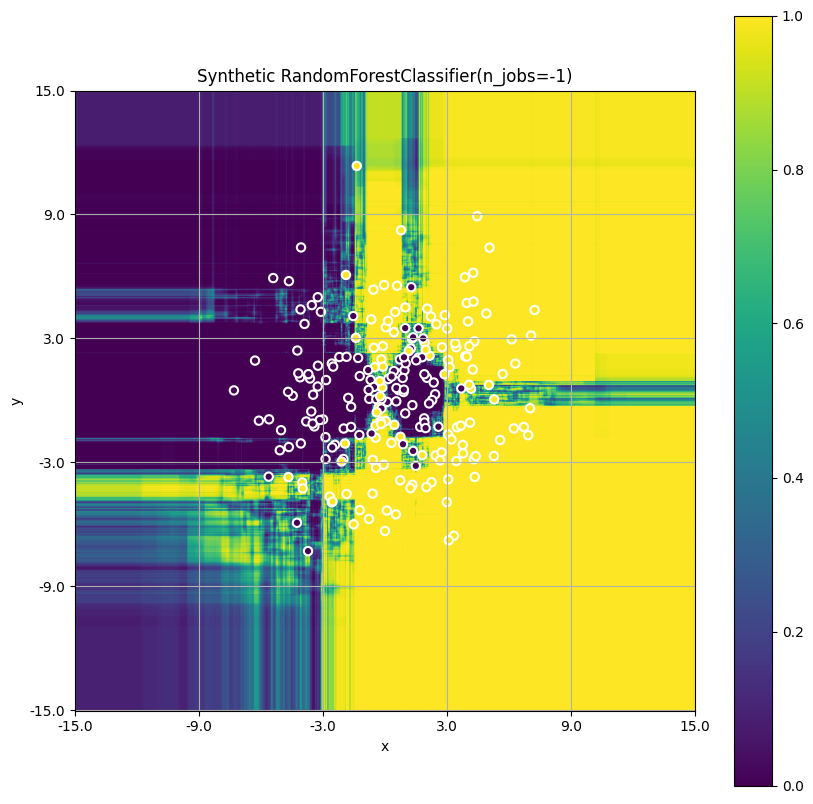

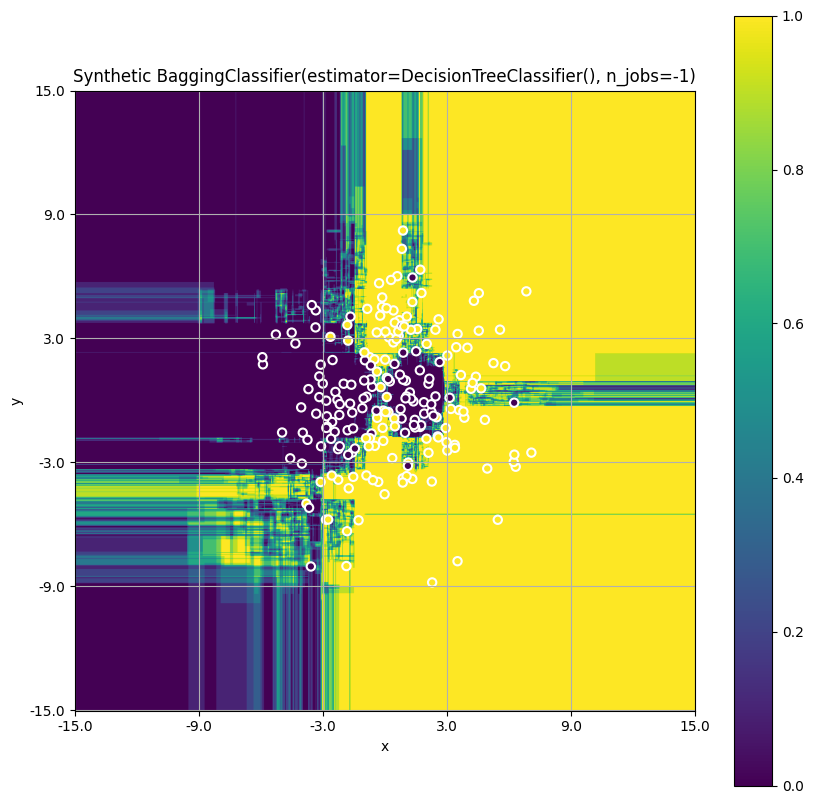

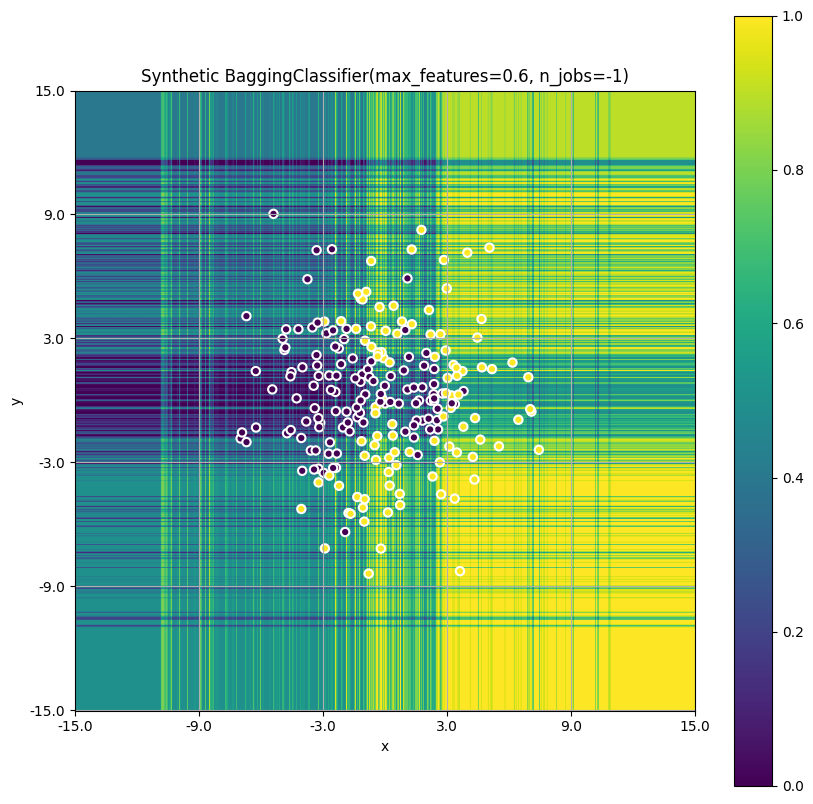

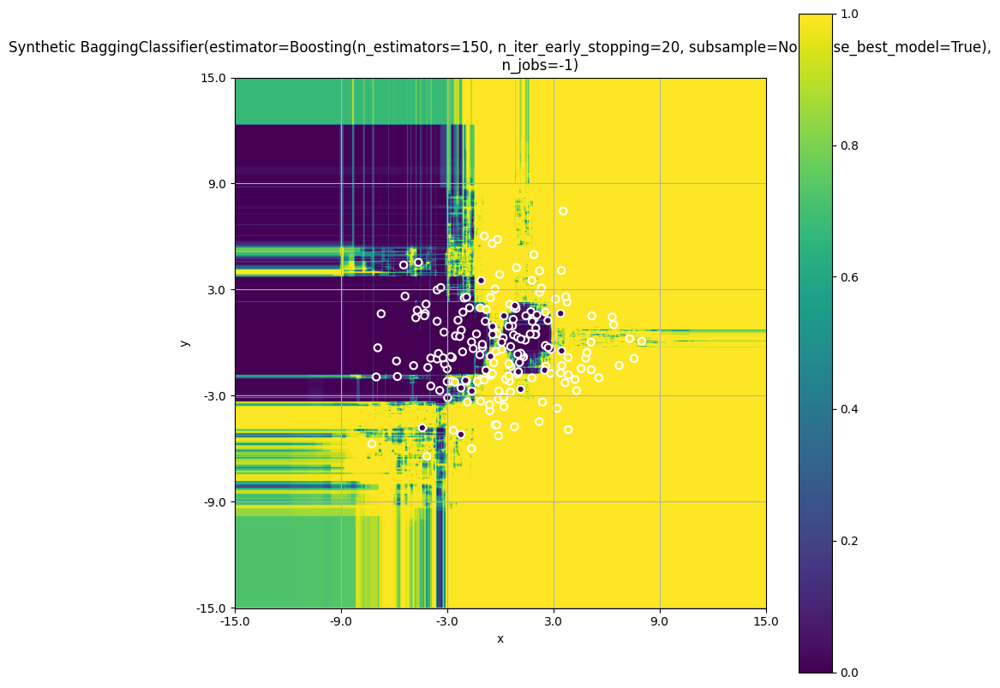

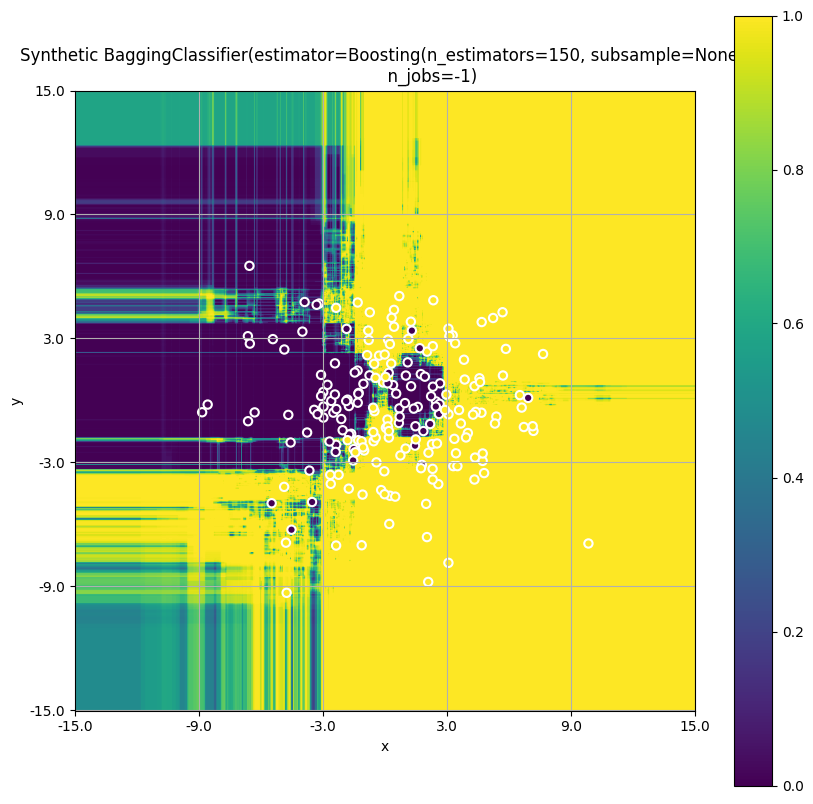

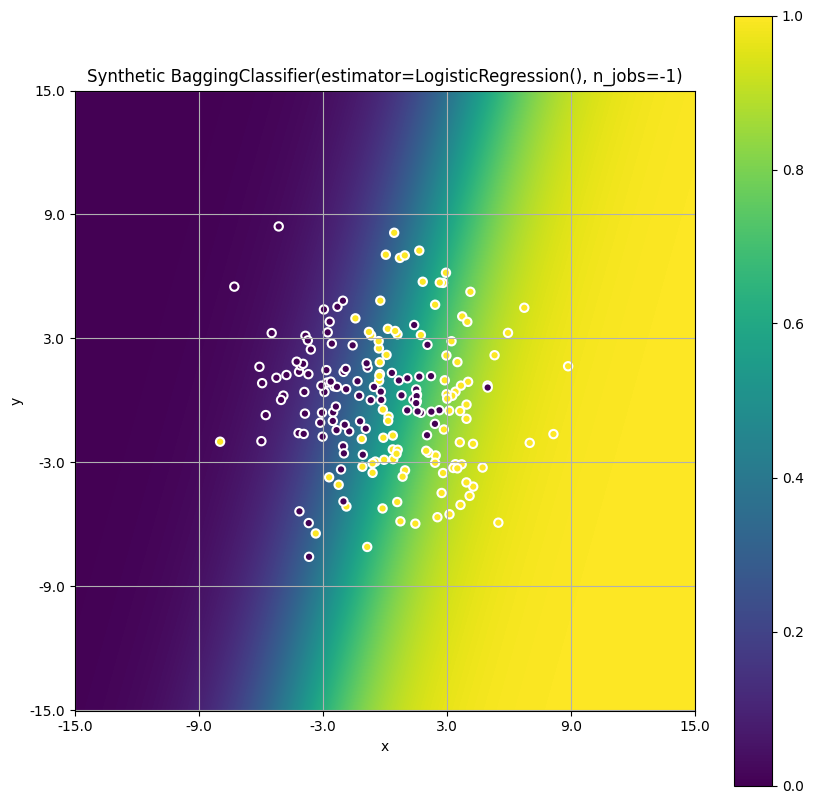

In [16]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

models = (
    RandomForestClassifier(n_jobs=-1),
    BaggingClassifier(estimator=DecisionTreeClassifier(min_samples_leaf=1), n_jobs=-1),
    BaggingClassifier(max_features=0.6, n_jobs=-1),
    BaggingClassifier(estimator=Boosting(n_estimators=150, use_best_model=True, n_iter_early_stopping=20, subsample=None), n_jobs=-1),
    BaggingClassifier(estimator=Boosting(n_estimators=150, subsample=None), n_jobs=-1),
    BaggingClassifier(estimator=LogisticRegression(), n_jobs=-1),
)

for model in models:
    model.fit(X_train_synthetic, y_train_synthetic)
    roc_auc = roc_auc_score(y_test_synthetic, model.predict_proba(X_test_synthetic)[:, 1])
    f1 = f1_score(y_test_synthetic, model.predict(X_test_synthetic))
    print('Synthetic', repr(model), 'ROC AUC=', roc_auc, 'F1=', f1)

X_train, y_train = df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values
X_test, y_test = df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_test.y.values
for model in models:
    model.fit(X_train, y_train)
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    f1 = f1_score(y_test, model.predict(X_test))
    print('Dataset', repr(model), 'ROC AUC=', roc_auc, 'F1=', f1)

for model in models:
    model.fit(X_train_synthetic, y_train_synthetic)
    plot_predicts(model, X_test_synthetic, y_test_synthetic, title=f'Synthetic {model!r}')


#### Если использовать деревья в качестве базового алгоритма, что лучше — бэггинг или бустинг? С чем это связано?

In [17]:
from sklearn.ensemble import BaggingClassifier, GradientBoostingClassifier


models = (
    BaggingClassifier(n_estimators=100, n_jobs=-1, random_state=42),
    Boosting(n_estimators=100, random_seed=42),
    GradientBoostingClassifier(n_estimators=100, random_state=42),
)

for model in models:
    model.fit(X_train_synthetic, y_train_synthetic)
    roc_auc = roc_auc_score(y_test_synthetic, model.predict_proba(X_test_synthetic)[:, 1])
    f1 = f1_score(y_test_synthetic, model.predict(X_test_synthetic))
    print('Synthetic', repr(model), 'ROC AUC=', roc_auc, 'F1=', f1)

X_train, y_train = df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values
X_test, y_test = df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_test.y.values
for model in models:
    model.fit(X_train, y_train)
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    f1 = f1_score(y_test, model.predict(X_test))
    print('Dataset', repr(model), 'ROC AUC=', roc_auc, 'F1=', f1)

/home/tiunovnn/analyze/venv/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/tiunovnn/analyze/venv/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

Synthetic BaggingClassifier(n_estimators=100, n_jobs=-1, random_state=42) ROC AUC= 0.9754217174160869 F1= 0.9098851477373123
Synthetic Boosting(n_estimators=100, random_seed=42) ROC AUC= 0.9717282008542295 F1= 0.919419011552658
Synthetic GradientBoostingClassifier(random_state=42) ROC AUC= 0.9814641578391857 F1= 0.9211691762621789
Dataset BaggingClassifier(n_estimators=100, n_jobs=-1, random_state=42) ROC AUC= 0.9449156777159538 F1= 0.8940042826552462
Dataset Boosting(n_estimators=100, random_seed=42) ROC AUC= 0.94576285171085 F1= 0.8805237315875615
Dataset GradientBoostingClassifier(random_state=42) ROC AUC= 0.9483909504618203 F1= 0.8948211425520555


Оба варианта хорошие. Моя реализация дает несколько худший результат, но это может быть связано с не оптимальностью параметров по умолчанию.

#### 4. (2 балла) Сравните на этих данных любую из трёх популярных имплементаций градиентного бустинга (xgboost, lightgbm, catboost) с вашей реализацией. Подберите основные гиперпараметры (число деревьев, длина шага, глубина дерева/число листьев) для обоих методов. Получилось ли у вас победить библиотечные реализации на тестовых данных? 

In [18]:
import catboost as cb
from sklearn.model_selection import RandomizedSearchCV

model = cb.CatBoostClassifier(
    loss_function='Logloss',
    bootstrap_type='Bernoulli',
    subsample=0.5,
    verbose=0,
)

space = {
    'learning_rate': np.linspace(0.01, 0.1, 10),
    'depth': np.arange(3, 10, dtype=np.uint16),
    'n_estimators': np.geomspace(10, 1000, 20, dtype=np.uint32),
}

cb_search_model = RandomizedSearchCV(model, space, n_iter=100, cv=3, random_state=42, scoring='roc_auc', verbose=2)
cb_search_model.fit(X_test, y_test)
cb_search_model.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END depth=6, learning_rate=0.04000000000000001, n_estimators=33; total time=   0.3s
[CV] END depth=6, learning_rate=0.04000000000000001, n_estimators=33; total time=   0.2s
[CV] END depth=6, learning_rate=0.04000000000000001, n_estimators=33; total time=   0.2s
[CV] END depth=6, learning_rate=0.020000000000000004, n_estimators=26; total time=   0.1s
[CV] END depth=6, learning_rate=0.020000000000000004, n_estimators=26; total time=   0.1s
[CV] END depth=6, learning_rate=0.020000000000000004, n_estimators=26; total time=   0.2s
[CV] END depth=3, learning_rate=0.06000000000000001, n_estimators=379; total time=   0.6s
[CV] END depth=3, learning_rate=0.06000000000000001, n_estimators=379; total time=   0.7s
[CV] END depth=3, learning_rate=0.06000000000000001, n_estimators=379; total time=   0.7s
[CV] END depth=5, learning_rate=0.04000000000000001, n_estimators=784; total time=   1.6s
[CV] END depth=5, learning_rate=0.040000

{'n_estimators': 183, 'learning_rate': 0.09000000000000001, 'depth': 6}

In [19]:
cb_search_model.best_score_

0.9399222484566935

In [20]:
model = cb_search_model.best_estimator_
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
f1 = f1_score(y_test, model.predict(X_test))
roc_auc, f1

(0.9693669320912764, 0.9080276448697502)

In [21]:
from sklearn.model_selection import RandomizedSearchCV, ParameterSampler

model = Boosting(
    subsample=0.5,
)
base_model_space = list(ParameterSampler({
        'max_depth': np.arange(3, 10, dtype=np.uint16),
}, 7))
base_model_space += list(ParameterSampler({
        'max_leaf_nodes': np.geomspace(10, 100000, 1000, dtype=np.uint32),
}, n_iter=1000))
space = {
    'learning_rate': np.linspace(0.01, 0.1, 10),
    'base_model_params': base_model_space,
    'n_estimators': np.geomspace(10, 1000, 20, dtype=np.uint32),
}

boosting_search_model = RandomizedSearchCV(model, space, n_iter=300, cv=3, random_state=42, scoring='roc_auc', n_jobs=-1, verbose=2)
boosting_search_model.fit(X_test, y_test)
boosting_search_model.best_params_

Fitting 3 folds for each of 300 candidates, totalling 900 fits


{'n_estimators': 33,
 'learning_rate': 0.06000000000000001,
 'base_model_params': {'max_leaf_nodes': 31}}

In [22]:
model = boosting_search_model.best_estimator_
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
f1 = f1_score(y_test, model.predict(X_test))
roc_auc, f1

(0.9720757970873019, 0.9107142857142857)

Моя реализация чуть хуже CatBoost'а по качеству при подобранных параметрах